# Thesis Dataset Plots

Each cell saves **one PNG** to `thesis_figures/`. No figure titles — labels only.

In [1]:
from pathlib import Path
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import LogNorm

# ── paths ─────────────────────────────────────────────────────────────────────
ROOT          = Path("/cluster/home/henrban/aquaculture-perception/data-processing")
SOLAQUA_YOLO  = ROOT / "vision/solaqua_fish/processed/split_yolo"
SONAR_YOLO    = ROOT / "sonar/net_fish_sonar_improved/processed"
SOLAQUA_W, SOLAQUA_H = 1280, 720
SONAR_W,   SONAR_H   = 1200, 700
SPLITS = ["train", "val", "test"]

HIST_COLOR   = "#3a7ebf"
NET_COLOR    = "#3a7ebf"
SPLIT_COLORS = {"train": "#2E86AB", "val": "#F18F01", "test": "#A23B72"}

# ── global rcParams — clean academic look ────────────────────────────────────
plt.rcParams.update({
    "font.family":        "serif",
    "font.size":          12,
    "axes.titlesize":     12,
    "axes.labelsize":     12,
    "xtick.labelsize":    11,
    "ytick.labelsize":    11,
    "legend.fontsize":    11,
    "figure.dpi":         150,
    "figure.facecolor":   "white",
    "axes.facecolor":     "white",
    "axes.spines.top":    True,
    "axes.spines.right":  True,
    "axes.spines.bottom": True,
    "axes.spines.left":   True,
    "axes.grid":          False,
    "savefig.dpi":        300,
    "savefig.bbox":       "tight",
})

def blue_palette(n):
    """Return n evenly-spaced blue shades from dark navy to light sky."""
    return [plt.cm.Blues(v) for v in np.linspace(0.85, 0.35, n)]

def save(_name):
    plt.show()

def pie(ax, values, labels, pct_threshold=3.0, nudge=1.25):
    """Pie chart with auto blue palette.
    Slices smaller than pct_threshold % have their pct text nudged radially
    outward (away from centre) to avoid collision with adjacent labels."""
    colors = blue_palette(len(values))
    wedges, texts, autotexts = ax.pie(
        values, labels=labels, colors=colors,
        autopct="%1.1f%%", startangle=90,
        wedgeprops=dict(linewidth=0),
        pctdistance=0.72,
    )
    total = sum(values)
    for at, v in zip(autotexts, values):
        at.set_fontsize(10); at.set_color("white"); at.set_fontweight("bold")
        if 100 * v / total < pct_threshold:
            x, y = at.get_position()
            at.set_position((x * nudge, y * nudge))
    for t in texts:
        t.set_fontsize(11)
    ax.set_aspect("equal")

print("Setup done.")

Setup done.


In [2]:
# ── load SOLAQUA_FISH ─────────────────────────────────────────────────────────
sol_inst, sol_img = [], []
for split in SPLITS:
    for lbl in sorted((SOLAQUA_YOLO / "labels" / split).glob("*.txt")):
        lines = [l for l in lbl.read_text().splitlines() if l.strip()]
        m   = re.search(r"-(bag\d+)_", lbl.stem)
        bag = m.group(1) if m else "unknown"
        for line in lines:
            _, xc, yc, wn, hn = map(float, line.split())
            sol_inst.append(dict(split=split, bag=bag, image=lbl.stem,
                                 xc=xc, yc=yc, wn=wn, hn=hn,
                                 w_px=wn*SOLAQUA_W, h_px=hn*SOLAQUA_H,
                                 area_px=wn*hn*SOLAQUA_W*SOLAQUA_H))
        sol_img.append(dict(split=split, bag=bag, image=lbl.stem, n_obj=len(lines)))

sol_df  = pd.DataFrame(sol_inst)
sol_img = pd.DataFrame(sol_img)

# ── load NET_FISH_SONAR_IMPROVED ──────────────────────────────────────────────
son_inst, son_img = [], []
for split in SPLITS:
    for lbl in sorted((SONAR_YOLO / "labels" / split).glob("*.txt")):
        lines = [l for l in lbl.read_text().splitlines() if l.strip()]
        m   = re.search(r"(bag\d+)", lbl.stem)
        bag = m.group(1) if m else "unknown"
        n_fish = n_net = 0
        for line in lines:
            parts = line.split()
            cls   = int(parts[0])
            xc, yc, wn, hn = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
            son_inst.append(dict(split=split, bag=bag, image=lbl.stem,
                                 cls=cls, cls_name="fish" if cls==0 else "net",
                                 xc=xc, yc=yc, wn=wn, hn=hn,
                                 w_px=wn*SONAR_W, h_px=hn*SONAR_H,
                                 area_px=wn*hn*SONAR_W*SONAR_H))
            if cls == 0: n_fish += 1
            else:        n_net  += 1
        son_img.append(dict(split=split, bag=bag, image=lbl.stem,
                            n_fish=n_fish, n_net=n_net, n_obj=n_fish+n_net))

son_df  = pd.DataFrame(son_inst)
son_img = pd.DataFrame(son_img)

print(f"solaqua_fish  : {len(sol_img):,} images, {len(sol_df):,} instances")
print(f"net_fish_sonar: {len(son_img):,} images, "
      f"{len(son_df[son_df.cls==0]):,} fish + {len(son_df[son_df.cls==1]):,} net")

solaqua_fish  : 793 images, 3,153 instances
net_fish_sonar: 2,136 images, 943 fish + 2,136 net


---
## 1 · Split summary — pie charts

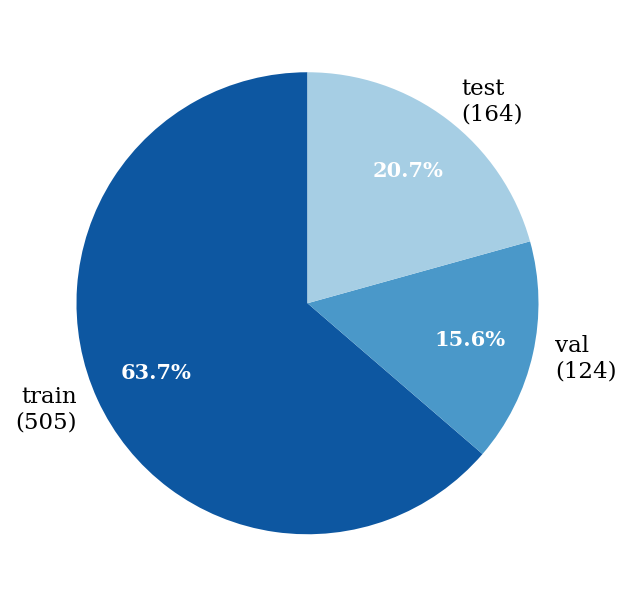

In [3]:
# solaqua_fish — images per split
cnts = sol_img.groupby("split").size().reindex(SPLITS)
lbls = [f"{s}\n({v})" for s, v in zip(SPLITS, cnts.values)]

fig, ax = plt.subplots(figsize=(5, 5))
pie(ax, cnts.values, lbls)
save("sol_split_images.png")

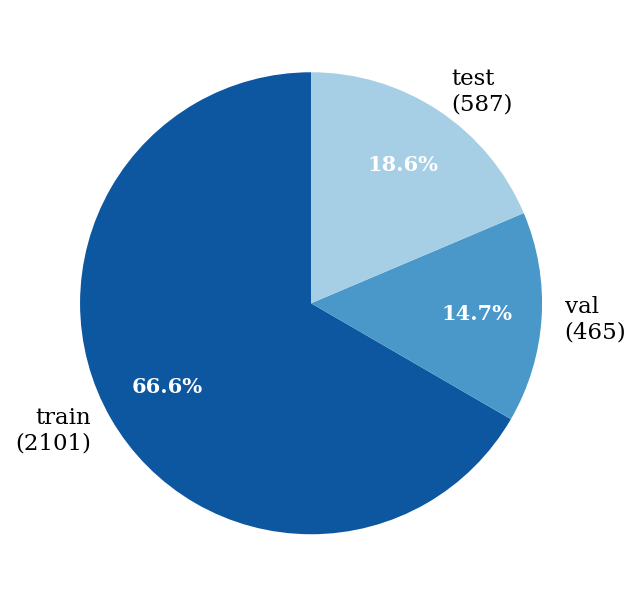

In [4]:
# solaqua_fish — fish instances per split
cnts = sol_df.groupby("split").size().reindex(SPLITS)
lbls = [f"{s}\n({v})" for s, v in zip(SPLITS, cnts.values)]

fig, ax = plt.subplots(figsize=(5, 5))
pie(ax, cnts.values, lbls)
save("sol_split_instances.png")

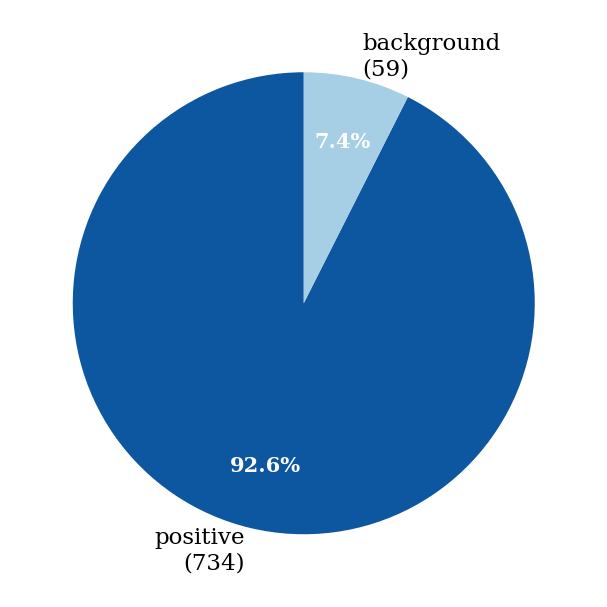

In [5]:
# solaqua_fish — positive vs background images
n_pos = int((sol_img.n_obj > 0).sum())
n_bg  = int((sol_img.n_obj == 0).sum())

fig, ax = plt.subplots(figsize=(5, 5))
pie(ax, [n_pos, n_bg], [f"positive\n({n_pos})", f"background\n({n_bg})"])
save("sol_positive_vs_bg.png")

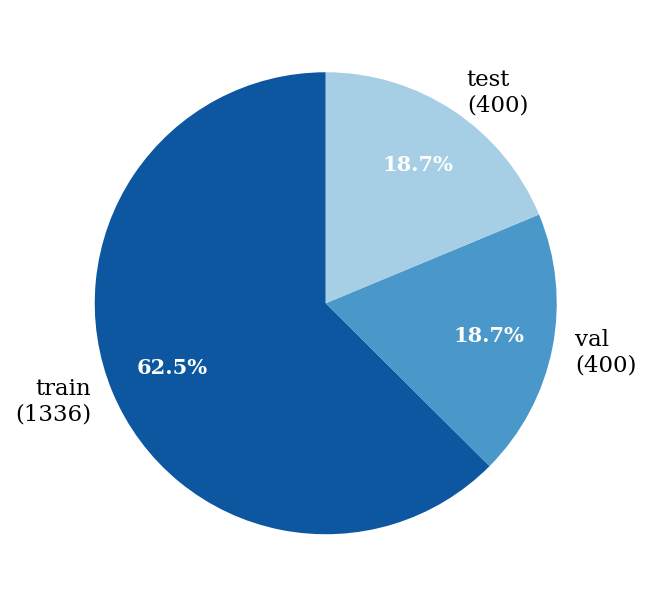

In [6]:
# net_fish_sonar — images per split
cnts = son_img.groupby("split").size().reindex(SPLITS)
lbls = [f"{s}\n({v})" for s, v in zip(SPLITS, cnts.values)]

fig, ax = plt.subplots(figsize=(5, 5))
pie(ax, cnts.values, lbls)
save("son_split_images.png")

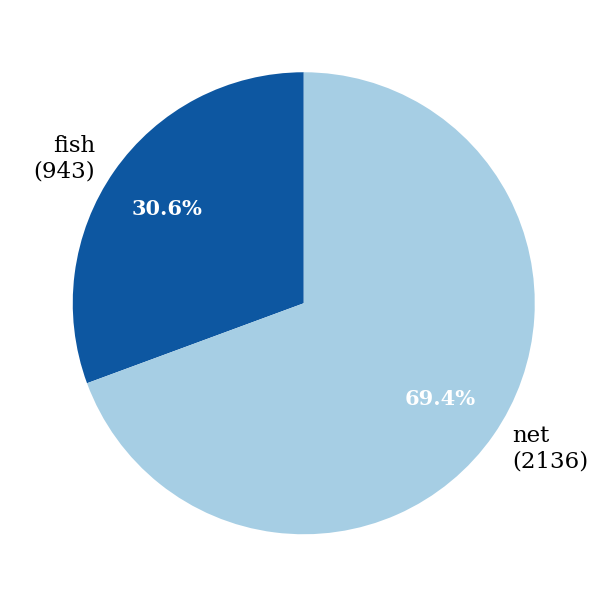

In [7]:
# net_fish_sonar — instances by class (fish vs net)
n_fish = len(son_df[son_df.cls == 0])
n_net  = len(son_df[son_df.cls == 1])

fig, ax = plt.subplots(figsize=(5, 5))
pie(ax, [n_fish, n_net], [f"fish\n({n_fish})", f"net\n({n_net})"])
save("son_instances_by_class.png")

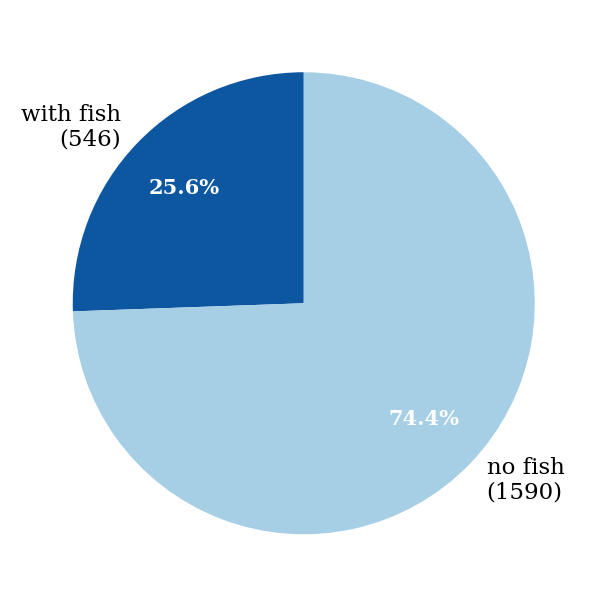

In [8]:
# net_fish_sonar — images with fish vs without fish
n_with    = int((son_img.n_fish > 0).sum())
n_without = int((son_img.n_fish == 0).sum())

fig, ax = plt.subplots(figsize=(5, 5))
pie(ax, [n_with, n_without], [f"with fish\n({n_with})", f"no fish\n({n_without})"])
save("son_fish_vs_nofish.png")

---
## 2 · Objects per image

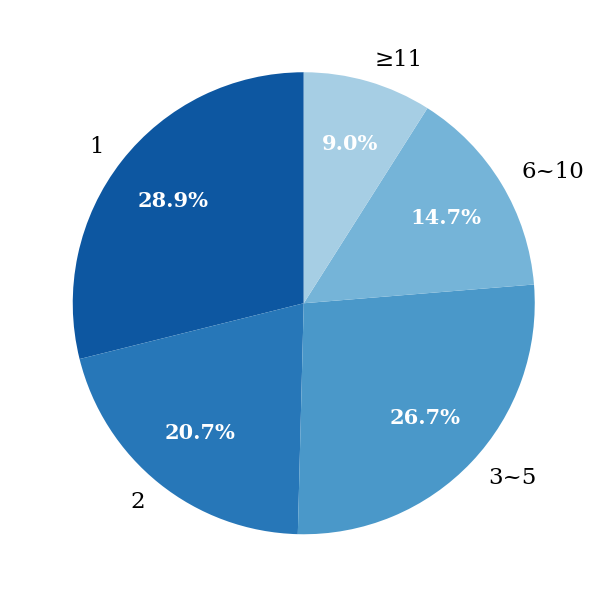

In [9]:
# solaqua_fish — objects-per-image bucket pie (positive images only)
def bucket_sol(n):
    if   n == 1:  return "1"
    elif n == 2: return "2"
    elif 3 <= n <= 5:  return "3~5"
    elif 6 <= n <= 10: return "6~10"
    else:              return "≥11"

ORDER = ["1", "2", "3~5", "6~10", "≥11"]
pos   = sol_img[sol_img.n_obj > 0].copy()
pos["bucket"] = pos["n_obj"].apply(bucket_sol)
cnts  = pos["bucket"].value_counts().reindex(ORDER, fill_value=0)
mask  = cnts > 0

fig, ax = plt.subplots(figsize=(5, 5))
pie(ax, cnts[mask].values, cnts[mask].index.tolist())
save("sol_obj_per_img_pie.png")

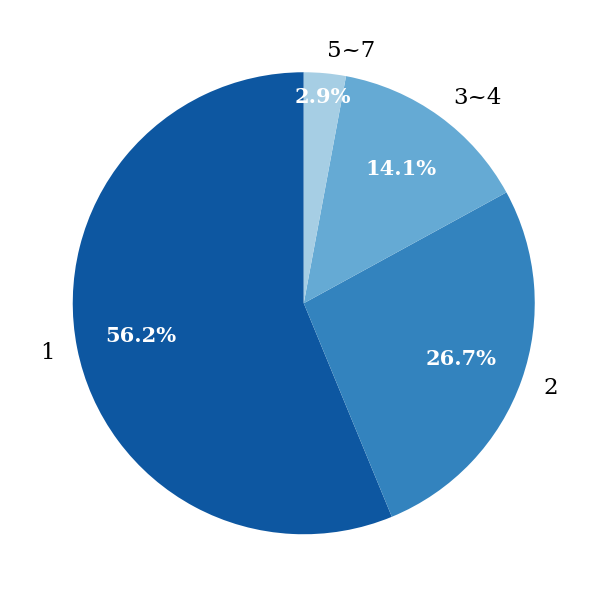

In [10]:
# net_fish_sonar — fish-per-image bucket pie (images with ≥1 fish)
def bucket_son(n):
    if   n == 1:       return "1"
    elif n==2:  return "2"
    elif 3 <= n <= 4: return "3~4"
    elif 5 <= n <= 7:  return "5~7"
    else:              return "≥8"

ORDER_S = ["1", "2","3~4", "5~7", "≥8"]
pos_s   = son_img[son_img.n_fish > 0].copy()
pos_s["bucket"] = pos_s["n_fish"].apply(bucket_son)
cnts_s  = pos_s["bucket"].value_counts().reindex(ORDER_S, fill_value=0)
mask_s  = cnts_s > 0

fig, ax = plt.subplots(figsize=(5, 5))
pie(ax, cnts_s[mask_s].values, cnts_s[mask_s].index.tolist())
save("son_fish_per_img_pie.png")

---
## 3 · Scale variance — bounding-box size histograms

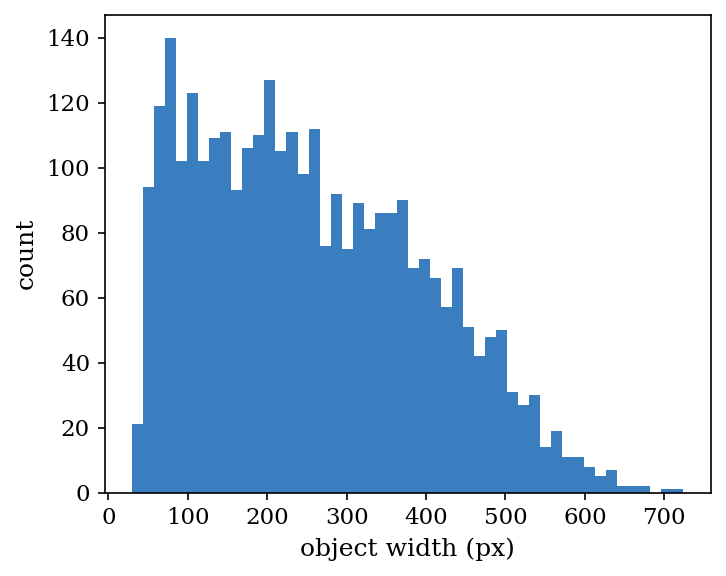

In [11]:
# solaqua_fish — fish object width (px)
vals = sol_df["w_px"]

fig, ax = plt.subplots(figsize=(5, 4))
ax.hist(vals, bins=50, color=HIST_COLOR, edgecolor="none")
ax.set_xlabel("object width (px)")
ax.set_ylabel("count")
plt.tight_layout()
save("sol_scale_width.png")

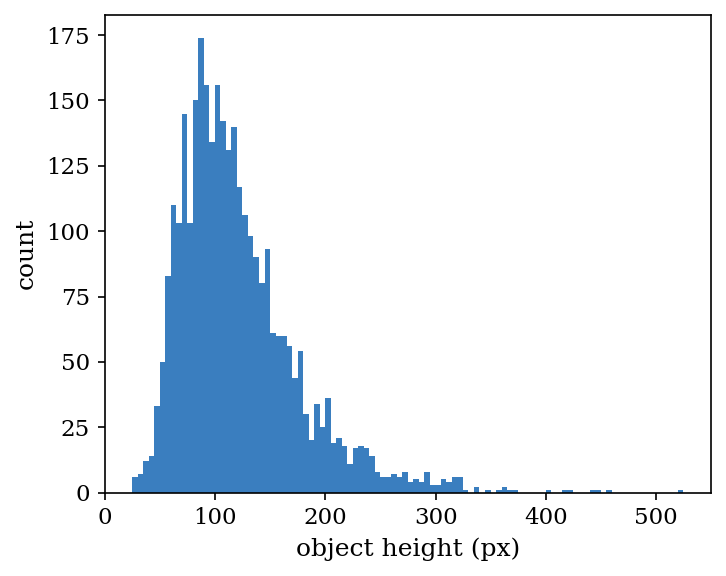

In [12]:
# solaqua_fish — fish object height (px)
vals = sol_df["h_px"]

fig, ax = plt.subplots(figsize=(5, 4))
ax.hist(vals, bins=100, color=HIST_COLOR, edgecolor="none")
ax.set_xlabel("object height (px)")
ax.set_ylabel("count")
plt.tight_layout()
save("sol_scale_height.png")

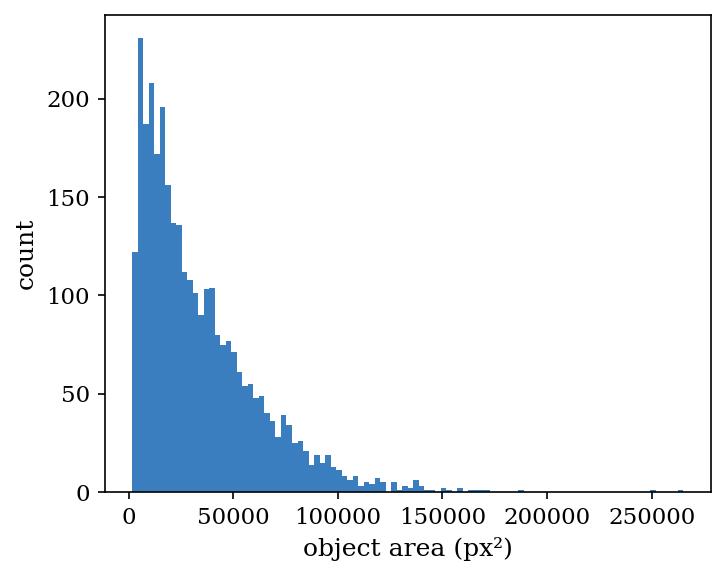

In [13]:
# solaqua_fish — fish bbox area (px²)
vals = sol_df["area_px"]

fig, ax = plt.subplots(figsize=(5, 4))
ax.hist(vals, bins=100, color=HIST_COLOR, edgecolor="none")
ax.set_xlabel("object area (px²)")
ax.set_ylabel("count")
plt.tight_layout()
save("sol_scale_area.png")

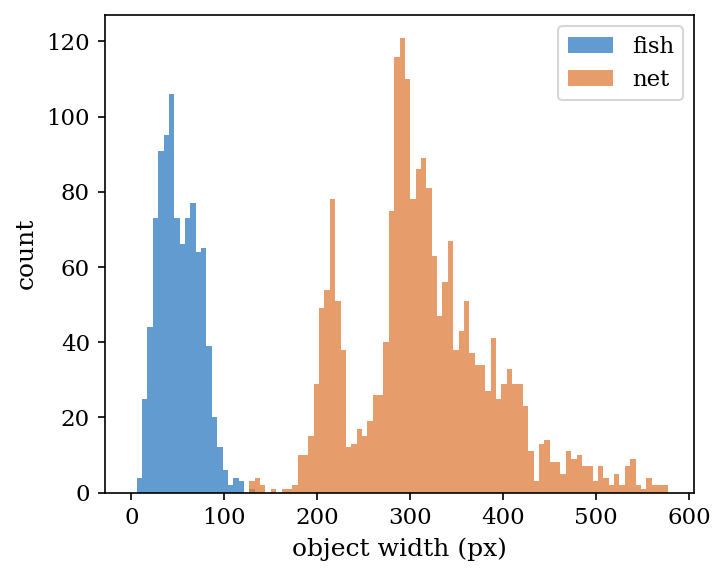

In [14]:
# net_fish_sonar — object width (px) — fish and net overlaid, shared bin width
fish_w = son_df[son_df.cls == 0]["w_px"]
net_w  = son_df[son_df.cls == 1]["w_px"]
bins_w = np.linspace(0, max(fish_w.max(), net_w.max()), 101)

fig, ax = plt.subplots(figsize=(5, 4))
ax.hist(fish_w, bins=bins_w, color="#2e7abf", alpha=0.75, edgecolor="none", label="fish")
ax.hist(net_w,  bins=bins_w, color="#e07b39", alpha=0.75, edgecolor="none", label="net")
ax.set_xlabel("object width (px)")
ax.set_ylabel("count")
ax.legend()
plt.tight_layout()
save("son_scale_width.png")

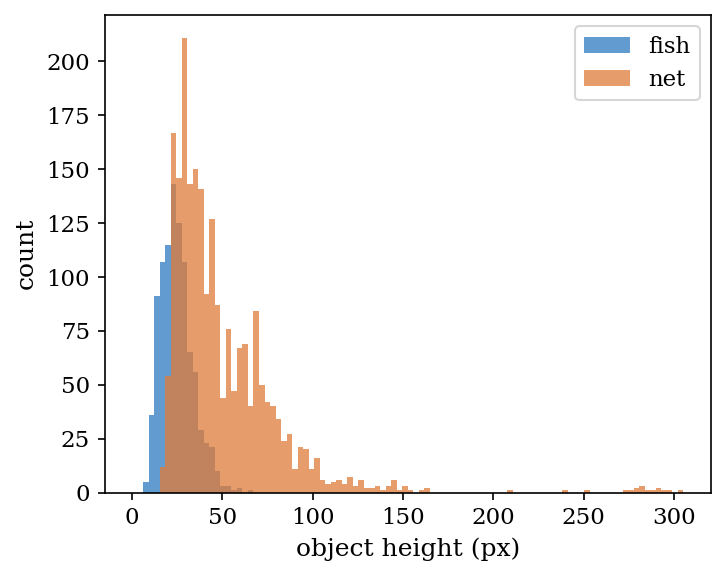

In [15]:
# net_fish_sonar — object height (px) — fish and net overlaid, shared bin width
fish_h = son_df[son_df.cls == 0]["h_px"]
net_h  = son_df[son_df.cls == 1]["h_px"]
bins_h = np.linspace(0, max(fish_h.max(), net_h.max()), 101)

fig, ax = plt.subplots(figsize=(5, 4))
ax.hist(fish_h, bins=bins_h, color="#2e7abf", alpha=0.75, edgecolor="none", label="fish")
ax.hist(net_h,  bins=bins_h, color="#e07b39", alpha=0.75, edgecolor="none", label="net")
ax.set_xlabel("object height (px)")
ax.set_ylabel("count")
ax.legend()
plt.tight_layout()
save("son_scale_height.png")

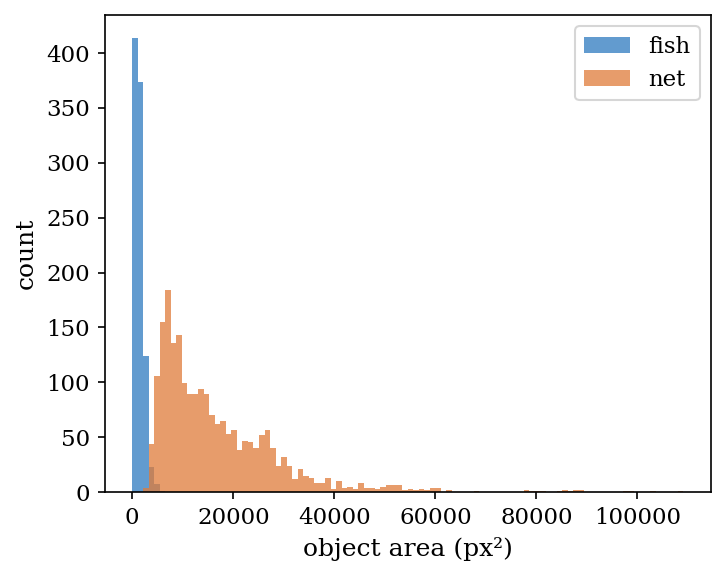

In [16]:
# net_fish_sonar — object area (px²) — fish and net overlaid, shared bin width
fish_a = son_df[son_df.cls == 0]["area_px"]
net_a  = son_df[son_df.cls == 1]["area_px"]
bins_a = np.linspace(0, max(fish_a.max(), net_a.max()), 101)

fig, ax = plt.subplots(figsize=(5, 4))
ax.hist(fish_a, bins=bins_a, color="#2e7abf", alpha=0.75, edgecolor="none", label="fish")
ax.hist(net_a,  bins=bins_a, color="#e07b39", alpha=0.75, edgecolor="none", label="net")
ax.set_xlabel("object area (px²)")
ax.set_ylabel("count")
ax.legend()
plt.tight_layout()
save("son_scale_area.png")

---
## 4 · Instance placement heatmaps

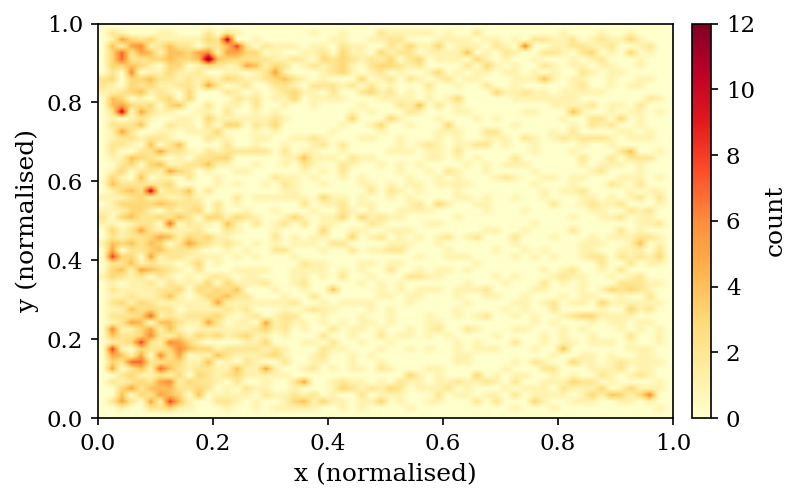

In [17]:
GRID = 60

# solaqua_fish — fish centre-point density (all splits)
fig, ax = plt.subplots(figsize=(5.5, 3.5))
h, _, _ = np.histogram2d(sol_df["xc"], sol_df["yc"], bins=GRID, range=[[0,1],[0,1]])
im = ax.imshow(h.T, origin="upper", extent=[0,1,1,0],
               aspect="auto", cmap="YlOrRd", interpolation="bilinear")
plt.colorbar(im, ax=ax, label="count", fraction=0.035, pad=0.03)
ax.set_xlabel("x (normalised)")
ax.set_ylabel("y (normalised)")
ax.invert_yaxis()
plt.tight_layout()
save("sol_placement_all.png")

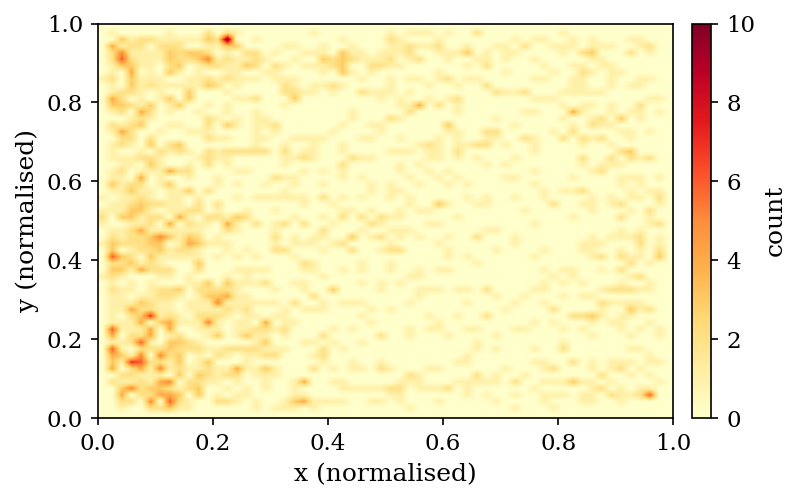

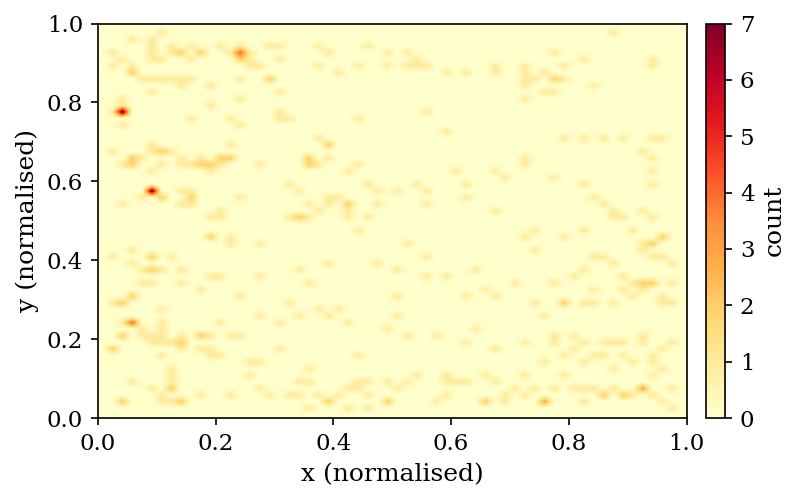

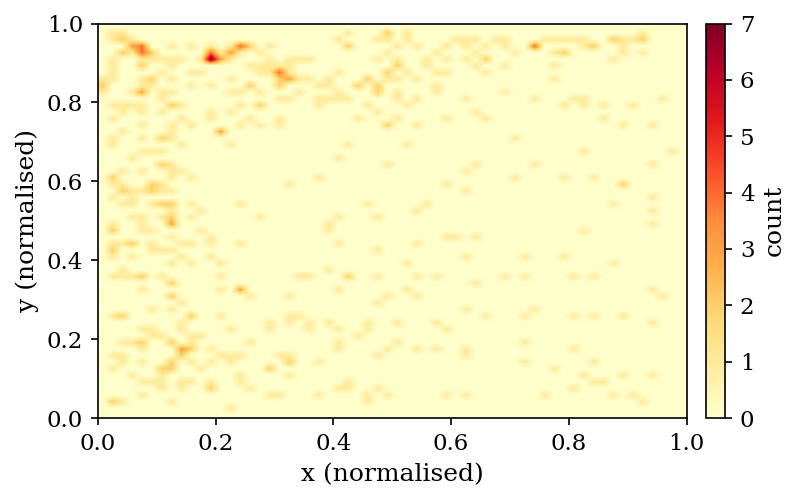

In [18]:
# solaqua_fish — fish centre-point density per split (one PNG each)
for split in SPLITS:
    sub = sol_df[sol_df.split == split]
    fig, ax = plt.subplots(figsize=(5.5, 3.5))
    h, _, _ = np.histogram2d(sub["xc"], sub["yc"], bins=GRID, range=[[0,1],[0,1]])
    im = ax.imshow(h.T, origin="upper", extent=[0,1,1,0],
                   aspect="auto", cmap="YlOrRd", interpolation="bilinear")
    plt.colorbar(im, ax=ax, label="count", fraction=0.035, pad=0.03)
    ax.set_xlabel("x (normalised)")
    ax.set_ylabel("y (normalised)")
    ax.invert_yaxis()
    plt.tight_layout()
    save(f"sol_placement_{split}.png")

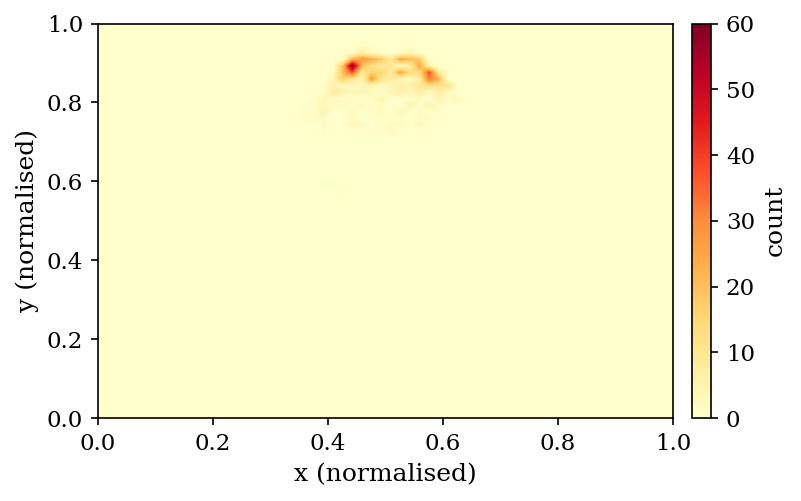

In [19]:
# net_fish_sonar — fish centre-point density (all splits)
sub = son_df[son_df.cls == 0]
fig, ax = plt.subplots(figsize=(5.5, 3.5))
h, _, _ = np.histogram2d(sub["xc"], sub["yc"], bins=GRID, range=[[0,1],[0,1]])
im = ax.imshow(h.T, origin="upper", extent=[0,1,1,0],
               aspect="auto", cmap="YlOrRd", interpolation="bilinear")
plt.colorbar(im, ax=ax, label="count", fraction=0.035, pad=0.03)
ax.set_xlabel("x (normalised)")
ax.set_ylabel("y (normalised)")
ax.invert_yaxis()
plt.tight_layout()
save("son_fish_placement_all.png")

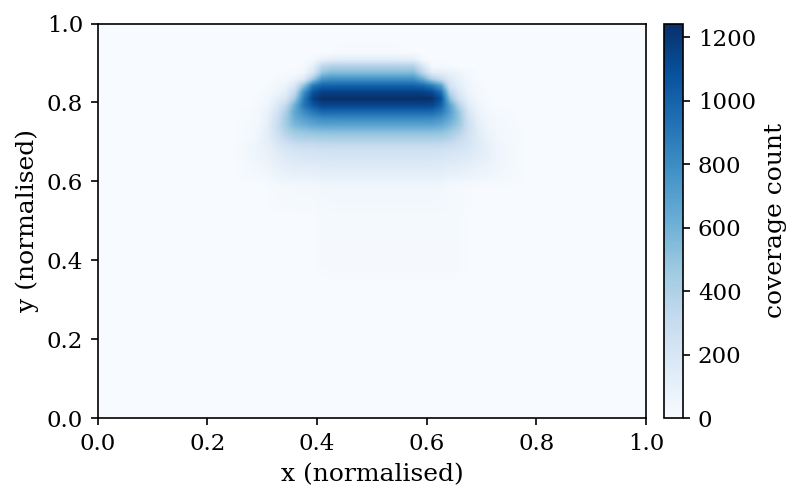

In [20]:
# net_fish_sonar — NET bbox coverage density (all splits)
net_sub  = son_df[son_df.cls == 1]
coverage = np.zeros((GRID, GRID), dtype=np.float32)
xs = np.linspace(0, 1, GRID + 1)
ys = np.linspace(0, 1, GRID + 1)

for _, r in net_sub.iterrows():
    x1 = max(0, np.searchsorted(xs, r.xc - r.wn/2) - 1)
    x2 = min(GRID, np.searchsorted(xs, r.xc + r.wn/2))
    y1 = max(0, np.searchsorted(ys, r.yc - r.hn/2) - 1)
    y2 = min(GRID, np.searchsorted(ys, r.yc + r.hn/2))
    coverage[x1:x2, y1:y2] += 1

fig, ax = plt.subplots(figsize=(5.5, 3.5))
im = ax.imshow(coverage.T, origin="upper", extent=[0,1,1,0],
               aspect="auto", cmap="Blues", interpolation="bilinear")
plt.colorbar(im, ax=ax, label="coverage count", fraction=0.035, pad=0.03)
ax.set_xlabel("x (normalised)")
ax.set_ylabel("y (normalised)")
ax.invert_yaxis()
plt.tight_layout()
save("son_net_coverage_all.png")

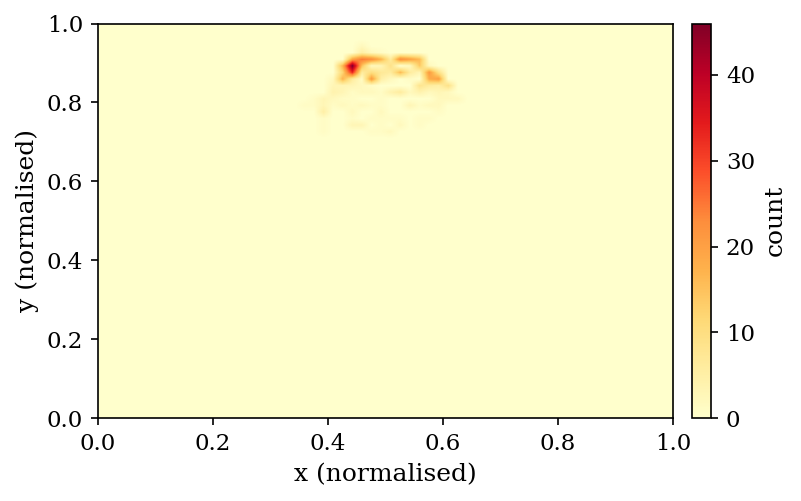

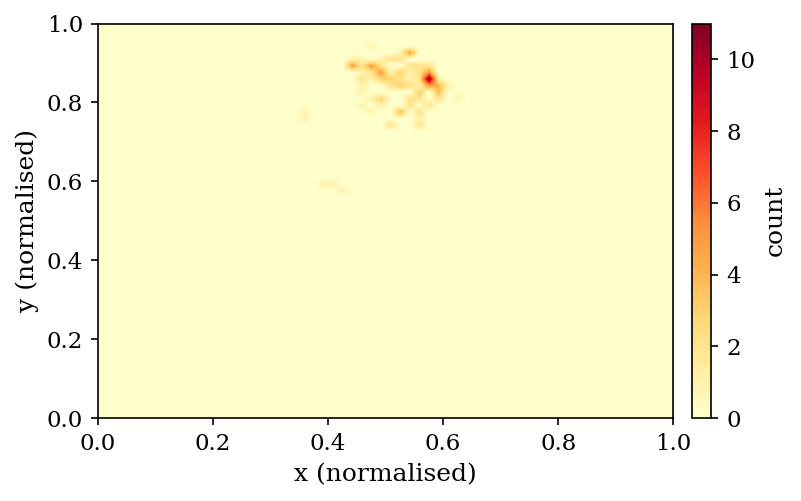

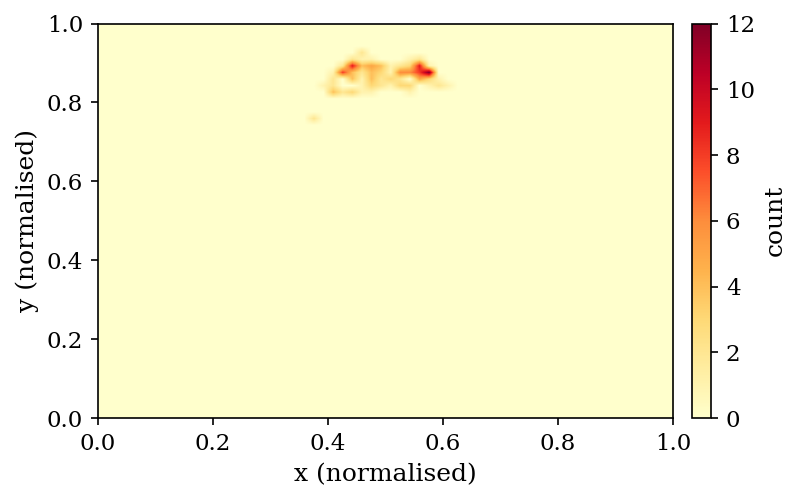

In [21]:
# net_fish_sonar — fish centre-point density per split (one PNG each)
for split in SPLITS:
    sub = son_df[(son_df.cls == 0) & (son_df.split == split)]
    if len(sub) == 0:
        continue
    fig, ax = plt.subplots(figsize=(5.5, 3.5))
    h, _, _ = np.histogram2d(sub["xc"], sub["yc"], bins=GRID, range=[[0,1],[0,1]])
    im = ax.imshow(h.T, origin="upper", extent=[0,1,1,0],
                   aspect="auto", cmap="YlOrRd", interpolation="bilinear")
    plt.colorbar(im, ax=ax, label="count", fraction=0.035, pad=0.03)
    ax.set_xlabel("x (normalised)")
    ax.set_ylabel("y (normalised)")
    ax.invert_yaxis()
    plt.tight_layout()
    save(f"son_fish_placement_{split}.png")

Split: val  |  Image: 1280×720  |  Instances: 8
  0 0.39637063227953406 0.5515806988352745 0.1469425956738769 0.09816971713810319
  0 0.372504159733777 0.7021630615640599 0.08610648918469216 0.24625623960066548
  0 0.4642262895174707 0.509983361064892 0.355657237936772 0.24459234608985006
  0 0.7417325291181364 0.08153078202995008 0.38279950083194664 0.15973377703826955
  0 0.7384567387687188 0.8652246256239602 0.061772046589018144 0.26955074875207985
  0 0.06551580698835274 0.3078202995008319 0.12541597337770383 0.19301164725457567
  0 0.16800124792013307 0.6372712146422629 0.10201747088186355 0.22961730449251255
  0 0.059432196339434265 0.6530782029950085 0.11886439267886853 0.26123128119800365


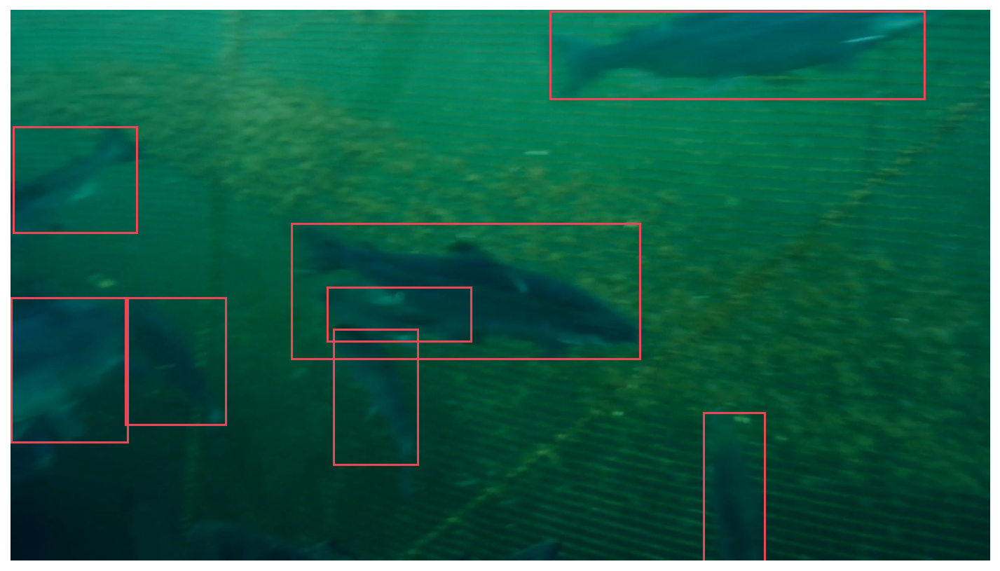

In [22]:
import matplotlib.patches as patches
from PIL import Image

STEM = "8a2be154-bag10_1724165072897601700"

# find the image and label across all splits
img_path = lbl_path = None
for split in SPLITS:
    p = SOLAQUA_YOLO / "images" / split / (STEM + ".jpg")
    if p.exists():
        img_path = p
        lbl_path = SOLAQUA_YOLO / "labels" / split / (STEM + ".txt")
        break

img = Image.open(img_path)
W, H = img.size

lines = [l for l in lbl_path.read_text().splitlines() if l.strip()]
print(f"Split: {split}  |  Image: {W}×{H}  |  Instances: {len(lines)}")
for l in lines:
    print(" ", l)

fig, ax = plt.subplots(figsize=(10, 5.6))
ax.imshow(img)
for line in lines:
    _, xc, yc, wn, hn = map(float, line.split())
    x1 = (xc - wn / 2) * W
    y1 = (yc - hn / 2) * H
    ax.add_patch(patches.Rectangle(
        (x1, y1), wn * W, hn * H,
        linewidth=1.5, edgecolor="#E84855", facecolor="none"
    ))
ax.axis("off")
plt.tight_layout()
plt.show()

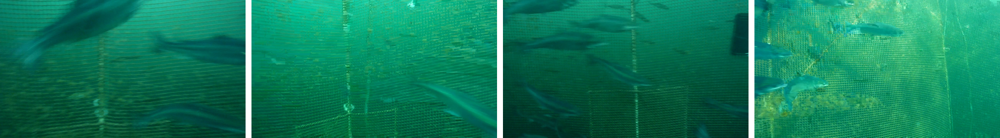

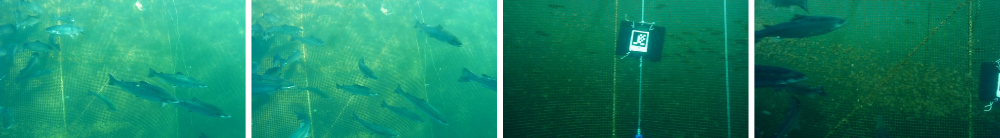

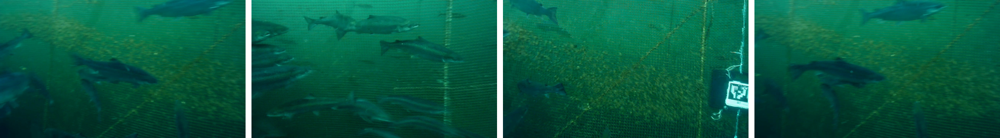

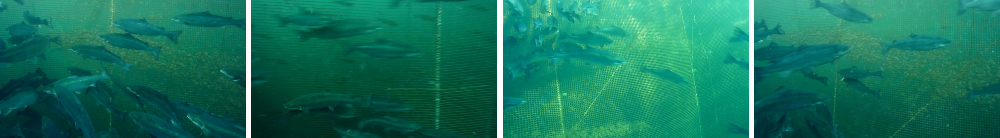

In [23]:
from PIL import Image as PILImage
from IPython.display import display as ipy_display

# ── challenge image lists ─────────────────────────────────────────────────────
CHALLENGES = {
    "blur/hangup":      ["926fd51b-bag15_1724169349865018900",
                         "d7858024-bag8_1724160079729076100",
                         "1ac40337-bag15_1724169388355807400",
                         "63411529-bag4_1724157148218968700"
                        ],
    "light_conditions":["55064814-bag4_1724157157333440800",   # light
                        "5ec16e77-bag4_1724157155887522000",   # light
                        "a26e0b34-bag10_1724165056783955600",  # dark
                        "1d442deb-bag10_1724165072110594800"], # dark
    "low_contrast":    ["8a2be154-bag10_1724165072897601700",
                        "868a8898-bag15_1724169391389912600",
                        "e27b972d-bag10_1724165071468232000",
                        "e29eebb1-bag10_1724165072745964700"],
    "clustered":       ["64c66cd9-bag11_1724165170620087300",
                        "6711cf60-bag15_1724169391068658000",
                        "8387f6bb-bag4_1724157151411737700",
                        "ab4e9e95-bag10_1724165075309866700"],
}

def find_sol_image(stem):
    for split in SPLITS:
        p = SOLAQUA_YOLO / "images" / split / (stem + ".jpg")
        if p.exists():
            return PILImage.open(p).convert("RGB")
    raise FileNotFoundError(stem)

GAP     = 12   # white pixels between images
THUMB_H = 280  # height each image is resized to

for name, stems in CHALLENGES.items():
    imgs   = [find_sol_image(s) for s in stems]
    thumbs = [img.resize((int(img.width * THUMB_H / img.height), THUMB_H),
                          PILImage.LANCZOS) for img in imgs]

    total_w = sum(t.width for t in thumbs) + GAP * (len(thumbs) - 1)
    canvas  = PILImage.new("RGB", (total_w, THUMB_H), (255, 255, 255))
    x = 0
    for t in thumbs:
        canvas.paste(t, (x, 0))
        x += t.width + GAP

    ipy_display(canvas)

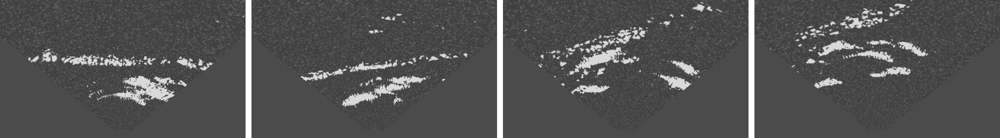

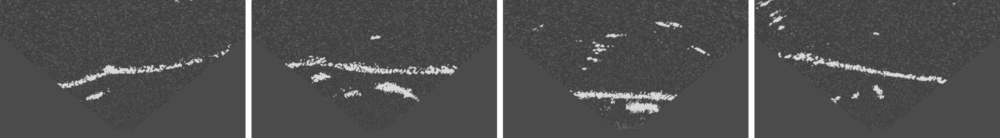

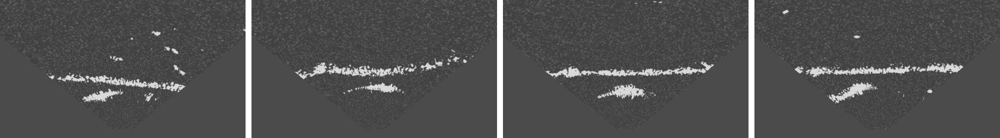

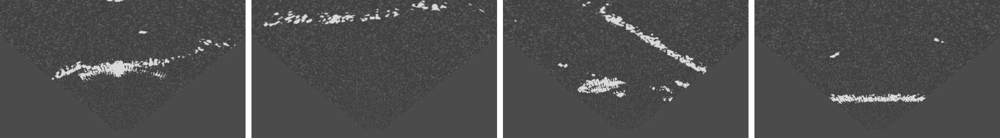

In [24]:
# ── net_fish_sonar_improved — challenge strips ────────────────────────────────
CHALLENGES_SON = {
    "clustered_fish":       ["bag1_1724155095897127800",
                             "bag2_1724166173608026200",
                             "bag4_1724157151790659000",
                             "bag4_1724157154539607300"],
    "fish_appearance":      ["bag7_1724156210669923100",
                             "bag9_1724165351514145800",
                             "bag2_1724166152362432700",
                             "bag10_1724166917817176300"],
    "fish_noise":           ["bag2_1724166167215974900",
                             "bag1_1724155143708462200",
                             "bag10_1724166904484298300",
                             "bag10_1724166919082769300"],
    "net_noise_appearance": ["bag7_1724156198378952000",
        # "bag7_1724156198898564700",
                             "bag3_1724154964688884000",
                             "bag2_1724166179054110600",
                             "bag9_1724165282331324000"],
}

def find_son_image(stem):
    for split in SPLITS:
        p = SONAR_YOLO / "images" / split / (stem + ".jpg")
        if p.exists():
            return PILImage.open(p).convert("RGB")
    raise FileNotFoundError(stem)

# Horizontal margins only — vertical extent is derived from 16:9, anchored at the bottom
SON_X = (0.30, 0.70)

def crop_son_16_9(img, x_norm=SON_X):
    """Same crop for every image: fixed horizontal margins, 16:9 height anchored at the very bottom."""
    W, H = img.size
    x1 = int(x_norm[0] * W)
    x2 = int(x_norm[1] * W)
    crop_w = x2 - x1
    crop_h = round(crop_w * 9 / 16)
    y1 = max(0, H - crop_h)
    return img.crop((x1, y1, x2, H))

for name, stems in CHALLENGES_SON.items():
    imgs   = [crop_son_16_9(find_son_image(s)) for s in stems]
    thumbs = [img.resize((int(THUMB_H * 16 / 9), THUMB_H),
                          PILImage.LANCZOS) for img in imgs]

    total_w = sum(t.width for t in thumbs) + GAP * (len(thumbs) - 1)
    canvas  = PILImage.new("RGB", (total_w, THUMB_H), (255, 255, 255))
    x = 0
    for t in thumbs:
        canvas.paste(t, (x, 0))
        x += t.width + GAP

    ipy_display(canvas)